
<div style="line-height:2px;border: solid orange">
    <p>
    <p style="color:blue;font-family:arial;text-align:right;font-size:20"> Visión por Computador &nbsp;&nbsp;
    <p style="color:blue;font-family:arial;text-align:right;font-size:16"> Master en Ciencias de Datos e Ingeniería de Ordenadores   &nbsp;&nbsp;
  <p style="color:blue;font-family:arial;text-align:right;font-size:16"> Rosa Mª. Rodríguez Sánchez   &nbsp;&nbsp;
    <p style="color:blue;font-family:arial;text-align:right;font-size:10"> Dpto. Ciencias de la Computación e Inteligencia Artificial. &nbsp;&nbsp;  
    <p style="color:blue;font-family:arial;text-align:right;font-size:10"> ETSIIT. Universidad de Granada   &nbsp;&nbsp;
        <p>
</div>

## Práctica 4 (Parte I) Filtrado Espacial. Aristas y Puntos Esquina

### Objetivos
En esta lección veremos como aplicar un filtro sobre una imagen con fines diferentes. Asi veremos:
* La operación de convolución. Correlación
* Suavizado 
 * Ejemplos de filtros lineales 
 * Ejemplos de filtros no lineales
* Ruido. 
* Detección de fronteras. 
* Detección de puntos de esquina



### La operación de convolución. Correlación
La operación de correlación entre una imagen I(x,y) y un filtro o máscara K(i,j) se define como:
$O(x,y)=\sum_{i=-N}^{n=N}\sum_{j=-M}^{m=M} I(x+i,y+j)K(i,j)$ siendo las dimensiones del filtro $2*N+1$ y $2*M+1$. En definitiva si $O(x,y)$ tiene un valor alto, este hecho indica que la  imagen I en el pixel (x,y) y entorno $2*N+1$ $2*M+1$ se parece mucho al filtro K. 
La operación de convolución es igual excepto que se define como:
$O(x,y)=\sum_{i=-N}^{n=N}\sum_{j=-M}^{m=M} I(x-i,y-j)K(i,j)$.

Cuando los filtros son simétricos la convolución es igual a la correlación.

<img src="ej_corre.png" width=60%>

OpenCV tiene definido la función cv2.filter2D para convolucionar una imagen con un kernel. 

Para ellos vamos a crear un filtro media 5x5. Y a continuación vamos a convolucionar con este filtro.


(<Axes: title={'center': 'Filtrada'}>,
 Text(0.5, 1.0, 'Filtrada'))

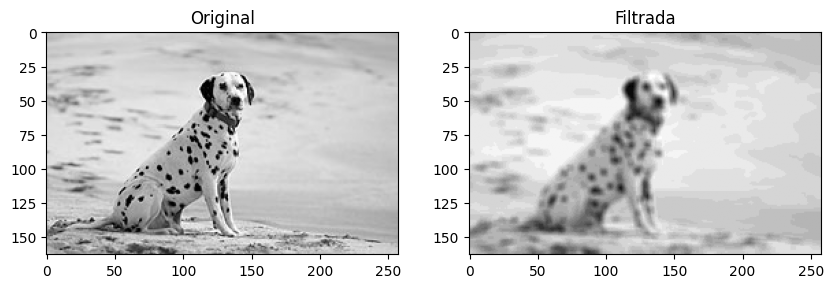

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

filtro = np.ones((5, 5), dtype="float32") * 1.0 / 250
I = cv2.imread("dalmata.jpg", 0)
# I=cv2.imread('dalmata.jpg') #se filtra la imagen en color
# el valor -1 indica que If tendrá el mismo tipo base que I
If = cv2.filter2D(I, -1, filtro)
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1), plt.imshow(I, "gray"), plt.title("Original")
plt.subplot(1, 2, 2), plt.imshow(If, "gray"), plt.title("Filtrada")


Podemos indicar diferentes formas de tratar los bordes:

 * BORDER_REPLICATE:     aaaaaa|abcdefgh|hhhhhhh 
 * BORDER_REFLECT:       fedcba|abcdefgh|hgfedcb
 * BORDER_REFLECT_101:   gfedcb|abcdefgh|gfedcba
 * BORDER_WRAP:          cdefgh|abcdefgh|abcdefg
 * BORDER_CONSTANT:      iiiiii|abcdefgh|iiiiiii siendo i=0 cuando usamos imfilter 'i'


In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

M = np.ones((3, 3), dtype=np.float32)
filtro = np.ones((3, 3), dtype="float32")
print(filtro)
Ifcte = cv2.filter2D(M, -1, filtro, borderType=cv2.BORDER_CONSTANT)
print(" Constante\n", Ifcte)

Ifcte = cv2.filter2D(M, -1, filtro, borderType=cv2.BORDER_REFLECT)
print(" Reflect \n", Ifcte)


Ifcte = cv2.filter2D(M, -1, filtro, borderType=cv2.BORDER_REPLICATE)
print(" Replicate \n", Ifcte)


[[1. 1. 1.]
 [1. 1. 1.]
 [1. 1. 1.]]
 Constante
 [[4. 6. 4.]
 [6. 9. 6.]
 [4. 6. 4.]]
 Reflect 
 [[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]
 Replicate 
 [[9. 9. 9.]
 [9. 9. 9.]
 [9. 9. 9.]]


[ 8  9 17]
[23 26 47]
[23 26 47]


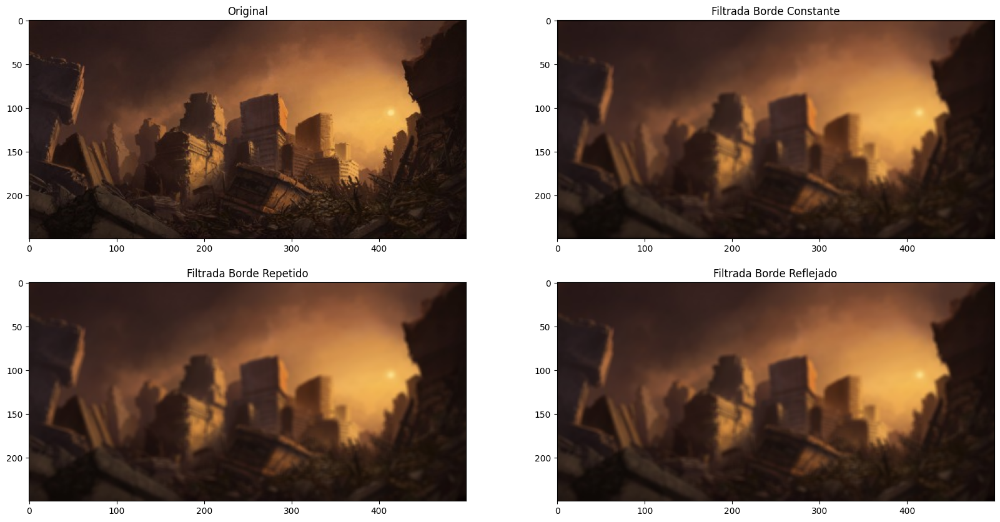

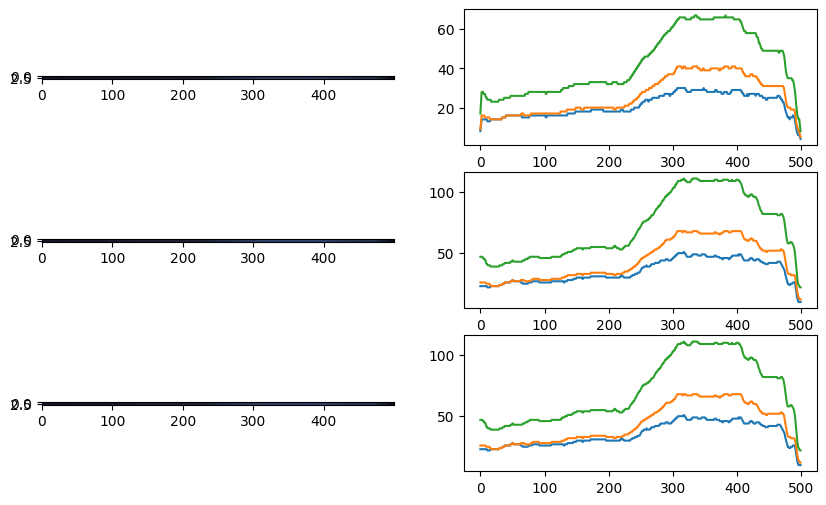

In [3]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

filtro = np.ones((5, 5), dtype="float32") * 1.0 / 25.0
I = cv2.imread("fantastic_village.jpg")

# el valor -1 indica que Ifcte tiene el mismo tipo base
Ifcte = cv2.filter2D(I, -1, filtro, borderType=cv2.BORDER_CONSTANT)
Irep = cv2.filter2D(I, -1, filtro, borderType=cv2.BORDER_REPLICATE)
Irefl = cv2.filter2D(I, -1, filtro, borderType=cv2.BORDER_REFLECT)
plt.figure(figsize=(20, 10))
(
    plt.subplot(2, 2, 1),
    plt.imshow(cv2.cvtColor(I, cv2.COLOR_BGR2RGB)),
    plt.title("Original"),
)
(
    plt.subplot(2, 2, 2),
    plt.imshow(cv2.cvtColor(Ifcte, cv2.COLOR_BGR2RGB)),
    plt.title("Filtrada Borde Constante"),
)
(
    plt.subplot(2, 2, 3),
    plt.imshow(cv2.cvtColor(Irep, cv2.COLOR_BGR2RGB)),
    plt.title("Filtrada Borde Repetido"),
)
(
    plt.subplot(2, 2, 4),
    plt.imshow(cv2.cvtColor(Irefl, cv2.COLOR_BGR2RGB)),
    plt.title("Filtrada Borde Reflejado"),
)

# Podemos ahora coger un trozo de la esquina superior
crop1 = Ifcte[0:4, 0 : I.shape[1]]
crop2 = Irep[0:4, 0 : I.shape[1]]
crop3 = Irefl[0:4, 0 : I.shape[1]]
# crop1=cv2.resize(crop1,(128,128))
plt.figure(figsize=(10, 6))
plt.subplot(321)
plt.imshow(crop1, "gray")
print(crop1[0, 0])
plt.subplot(322)
# plt.hist(crop1.ravel(),256,[0,256]);
plt.plot(range(I.shape[1]), crop1[0, :])
plt.subplot(323)
plt.imshow(crop2, "gray")
print(crop2[0, 0])
plt.subplot(324)
# plt.hist(crop2.ravel(),256,[0,256]);
plt.plot(range(I.shape[1]), crop2[0, :])
plt.subplot(325)
plt.imshow(crop3, "gray")
print(crop3[0, 0])
plt.subplot(326)
plt.plot(range(I.shape[1]), crop2[0, :])

### Suavizado de una imagen
EL emborramiento de una imagen se logra con filtros denominados paso-bajo. Estos filtros por un lado ayuda a eliminar ruido pero favorece el desenfoque de la imagen, ya que elimina lo que se conoce como contenido de altas frecuencias o detalle. Vamos a ver diferentes filtros para suavizar una imagen.
#### Promedio
Cuando filtramos con un filtro promedio estamos obteniendo el valor medio de los vecinos y del valor de un pixel donde se centra el filtro. Por ejemplo 

(<Axes: title={'center': 'Suavizada Promedio 3x3'}>,
 Text(0.5, 1.0, 'Suavizada Promedio 3x3'))

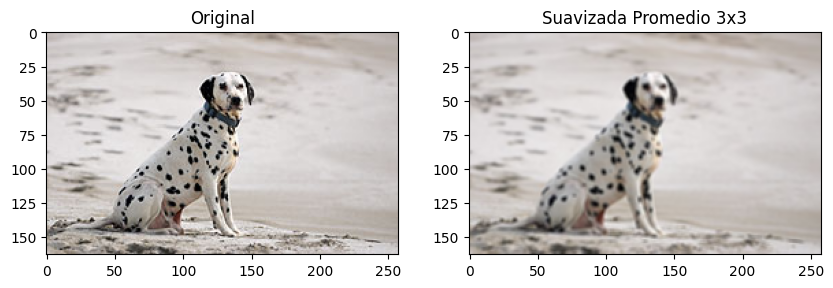

In [4]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

filtro = np.ones((3, 3), dtype="float32") * 1.0 / 9.0
I = cv2.imread("dalmata.jpg")
# el valor -1 indica que Iout tiene el mismo tipo base
Iout = cv2.filter2D(I, -1, filtro, (cv2.BORDER_CONSTANT, 0))
plt.figure(figsize=(10, 10))
(
    plt.subplot(1, 2, 1),
    plt.imshow(cv2.cvtColor(I, cv2.COLOR_BGR2RGB)),
    plt.title("Original"),
)
(
    plt.subplot(1, 2, 2),
    plt.imshow(cv2.cvtColor(Iout, cv2.COLOR_BGR2RGB)),
    plt.title("Suavizada Promedio 3x3"),
)

Podemos crear un filtro promedio que no sea cuadrado. De forma que en una dirección se puede obtener mayor desenfoque que en la otra dirección

(<Axes: title={'center': 'Suavizada Promedio 3x9'}>,
 Text(0.5, 1.0, 'Suavizada Promedio 3x9'))

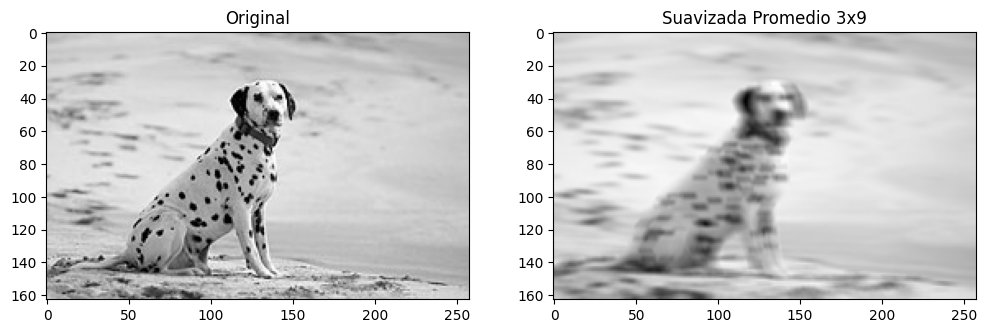

In [5]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

filtro = np.ones((3, 9), dtype="float32") * 1.0 / 27.0
I = cv2.imread("dalmata.jpg", 0)
# el valor -1 indica que Ifcte tiene el mismo tipo base
Iout = cv2.filter2D(I, -1, filtro, (cv2.BORDER_CONSTANT, 0))
plt.figure(figsize=(12, 12))
plt.subplot(1, 2, 1), plt.imshow(I, "gray"), plt.title("Original")
plt.subplot(1, 2, 2), plt.imshow(Iout, "gray"), plt.title("Suavizada Promedio 3x9")

Podemos también obtener un filtro promedio con forma de disco 

(<matplotlib.image.AxesImage at 0x7dad41539270>,
 Text(0.5, 1.0, 'Suavizada disco radio 3'))

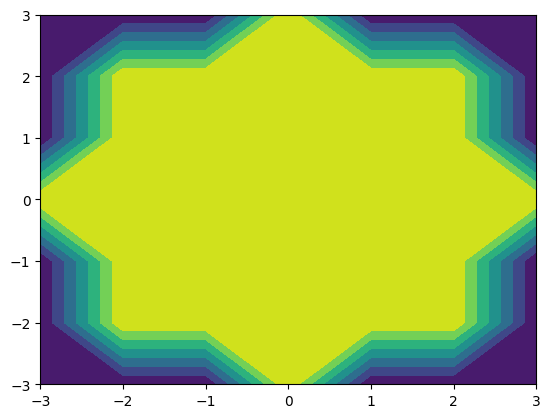

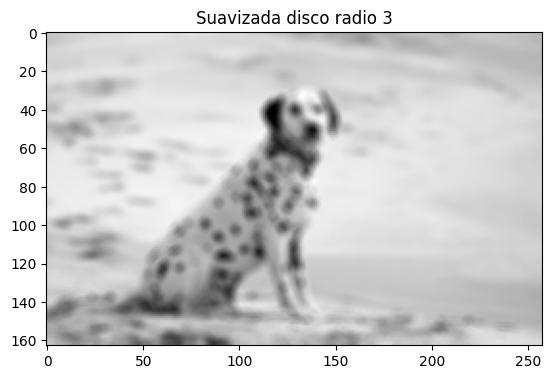

In [6]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

radio = 3

filtro = np.ones((radio * 2 + 1, radio * 2 + 1), dtype="float32")
x = np.arange(-radio, radio + 1, 1)
y = np.arange(-radio, radio + 1, 1)
xx, yy = np.meshgrid(x, y, sparse=True)
z = np.sqrt(xx**2 + yy**2)
disco = (z <= radio) * filtro
factor = np.sum(disco)
disco = disco / factor
plt.figure()
h = plt.contourf(x, y, disco)
I = cv2.imread("dalmata.jpg", 0)
Iout = cv2.filter2D(I, -1, disco)
plt.figure()
plt.imshow(Iout, "gray"), plt.title("Suavizada disco radio 3")


Podemos usar también la funcion cv2.blur para directamente convolucionar una imagen con un filtro promedio

(([], []), ([], []))

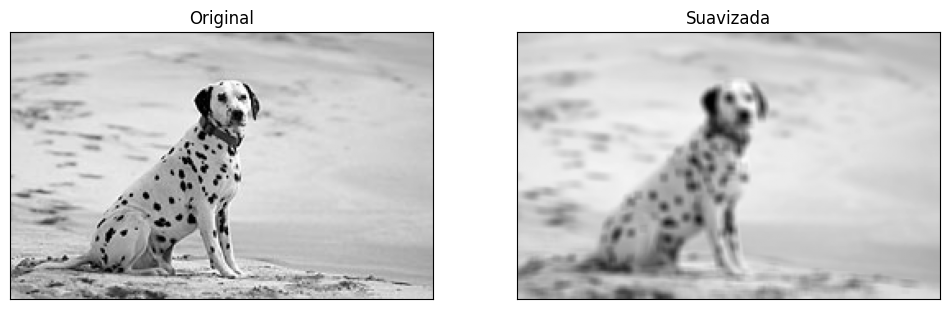

In [7]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Leemos la imagen en color
img = cv2.imread("dalmata.jpg", 0)
blur = cv2.blur(img, (5, 5))
plt.figure(figsize=(12, 8))
plt.subplot(121), plt.imshow(img, "gray"), plt.title("Original")
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur, "gray"), plt.title("Suavizada")
plt.xticks([]), plt.yticks([])


#### Gausiana
Se usa un kernel gausiano para suavizar la imagen, para ello usamos la función **cv2.GaussianBlur()**. Se debe especificar el ancho y alto del nucleo que debe ser positivo e impar. Tambien podemos especificar la desviación en la dirección X e Y del filtro gausiano, sigmaX=$\sigma_{X}$ y sigmaY=$\sigma_{Y}$ respectivamente. Si solamente se especifica sigmaX, sigmaY se supone que toma el mismo valor. Cuando a ambos le damos el valor 0 entonces se deducen a partir del tamaño del kernel. El filtro gausiano es muy efectivo para eliminar ruido gausiano en una imagen.


(([], []), ([], []))

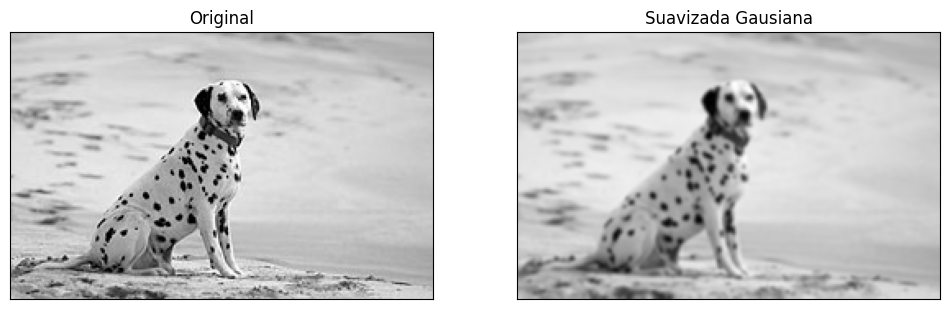

In [8]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Leemos la imagen en color
img = cv2.imread("dalmata.jpg", 0)
# sigma_x y sigma_y se obtiene a partir de las dimensiones por eso el 0
blur = cv2.GaussianBlur(img, (5, 5), 0)
plt.figure(figsize=(12, 8))
plt.subplot(121), plt.imshow(img, "gray"), plt.title("Original")
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur, "gray"), plt.title("Suavizada Gausiana")
plt.xticks([]), plt.yticks([])

Podemos obtener el filtro gausiano de la siguiente forma

Kernel: 
 [[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


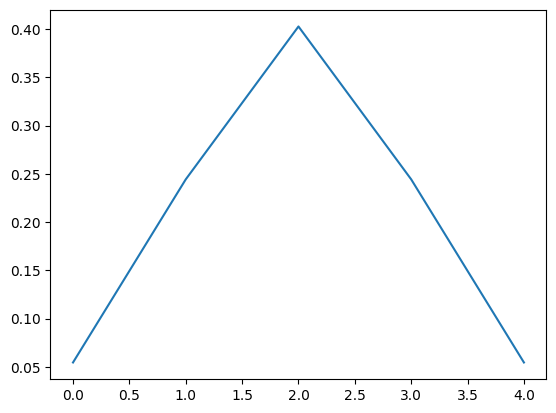

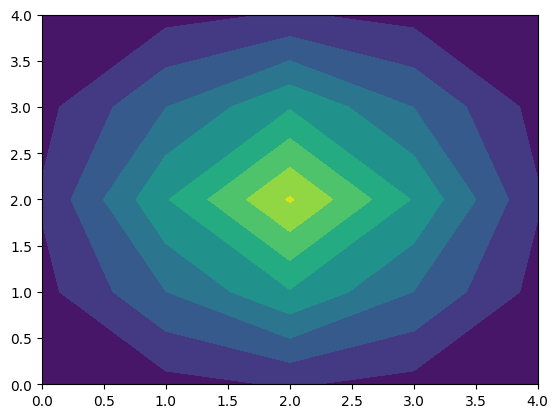

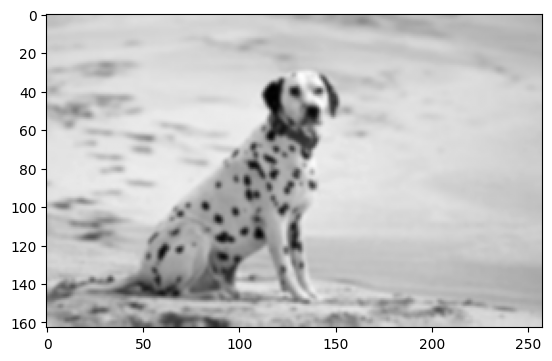

In [9]:
# filtro 5x5 con sigma 1
xdir_gauss = cv2.getGaussianKernel(5, 1.0)
kernel = np.multiply(xdir_gauss.T, xdir_gauss)
print("Kernel: \n", kernel)
from matplotlib import pyplot as plt

plt.figure()
plt.plot(xdir_gauss)
plt.figure()
plt.contourf(kernel)
Iout = cv2.filter2D(I, -1, kernel)
# o haciendolo separable sería
# Iout=cv2.filter2D(I,-1,xdir_gauss)
# Iout=cv2.filter2D(Iout,-1,xdir_gauss.T)
plt.figure()
plt.imshow(Iout, "gray")

#### Filtro Mediana
La función cv2.medianBlur()  obtiene la mediana de los pixeles en la que superpone el kernel de forma que el punto central se susituye por el valor mediana. Este filtro es muy efectivo para eliminar ruido del tipo sal y pimienta. El tamaño del kernel debe ser impar y positivo.


(([], []), ([], []))

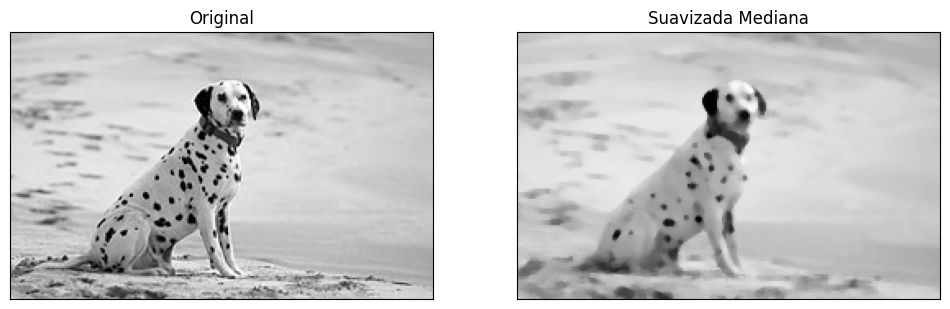

In [10]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Leemos la imagen en color
img = cv2.imread("dalmata.jpg", 0)
blur = cv2.medianBlur(img, 5)
plt.figure(figsize=(12, 8))
plt.subplot(121), plt.imshow(img, "gray"), plt.title("Original")
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur, "gray"), plt.title("Suavizada Mediana")
plt.xticks([]), plt.yticks([])

#### Filtrado BIlateral
Los filtros de suavizado que hemos visto emborrona las aristas. Sin embargo el filtro bilateral cv2.bilateralFilter(), no tiene este efecto colateral y sigue siendo muy efectivo para elimnar ruido mientras que preserva las aristas.
El filtro bilateral usa un filtro gausiano multiplicado por otro filtro gausiano que afecta a las intensidades de los pixeles. Este segundo filtro lo que hace es que aquellos pixeles en el entorno del pixel central que no se diferencie mucho a este formaran parte del suavizado. 
Los parámetros que le damos son:
* img- La imagen a filtrar
* d − un entero representando el tamaño del entorno
* sigmaColor − entero representando el sigma para suavizar
* sigmaSpace − entero representando el sigma de la segunda gausiana que mira la diferencia en intensidades

(([], []), ([], []))

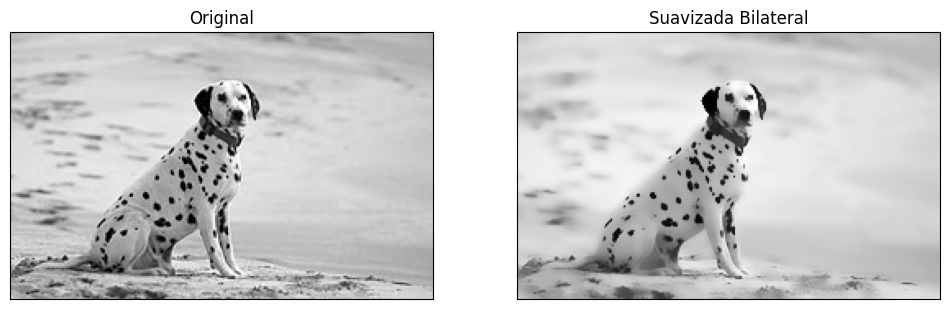

In [11]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Leemos la imagen en color
img = cv2.imread("dalmata.jpg", 0)
blur = cv2.bilateralFilter(img, 9, 50, 75)
plt.figure(figsize=(12, 8))
plt.subplot(121), plt.imshow(img, "gray"), plt.title("Original")
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur, "gray"), plt.title("Suavizada Bilateral")
plt.xticks([]), plt.yticks([])

### Eliminación de Ruido con filtros de Suavizado

In [12]:
# Inserta ruido s&p en una imagen monobanda
def addsalt_pepper(img, SNR):
    img_ = img.copy()
    h, w = img_.shape
    # snr numero de pixeles que se quedaran sin ruido
    mask = np.random.choice(
        (0, 1, 2), size=(h, w), p=[SNR, (1 - SNR) / 2.0, (1 - SNR) / 2.0]
    )
    img_[mask == 1] = 255  # sal
    img_[mask == 2] = 0  #  pimienta
    return img_


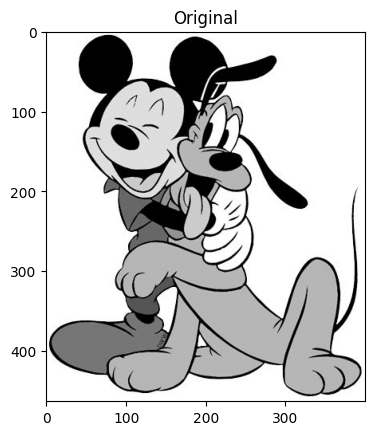

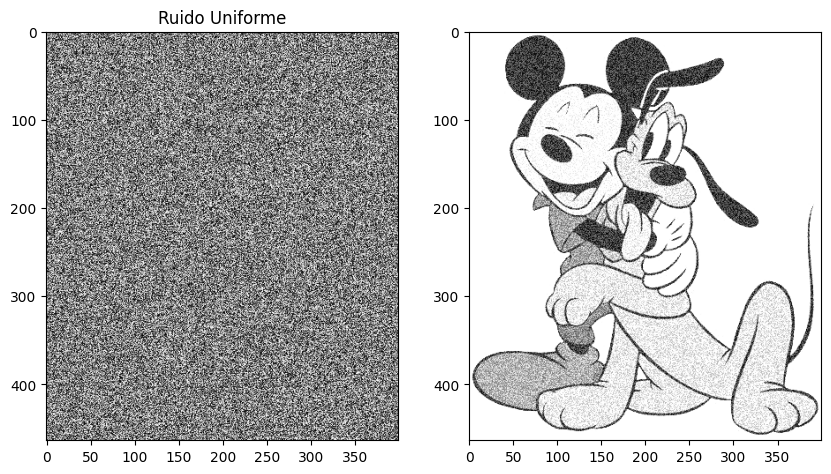

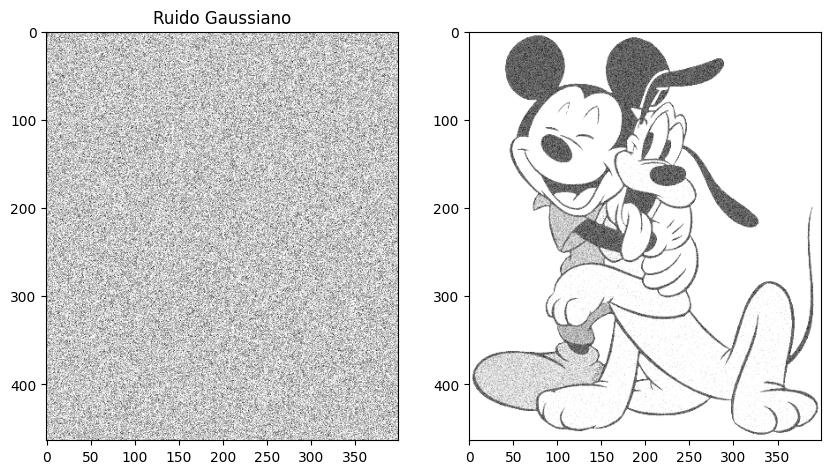

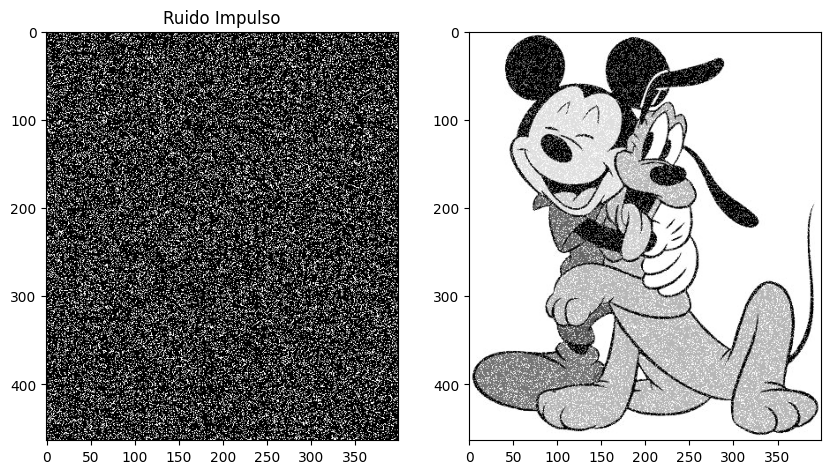

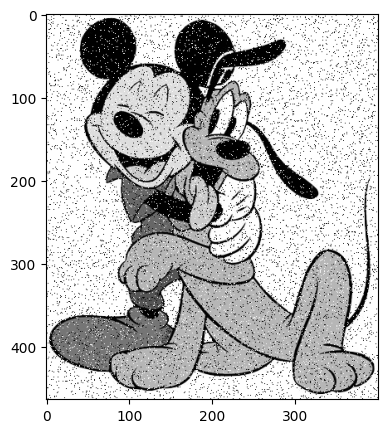

In [13]:
# Generamos ruido uniforme
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread("miki_pluto.jpg", 0)
uniform_noise = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
gaussian_noise = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
cv2.randu(uniform_noise, 0, 255)
cv2.randn(gaussian_noise, 200, 50)
ret, impulse_noise = cv2.threshold(uniform_noise, 200, 255, cv2.THRESH_BINARY)

# Añadimos el ruido
img_nu = cv2.addWeighted(img, 1, uniform_noise, 0.5, 1)
img_ng = cv2.addWeighted(img, 1, gaussian_noise, 0.5, 1)
img_ni = cv2.addWeighted(img, 1, impulse_noise, 0.5, 1)
img_sp = addsalt_pepper(img, 0.9)
plt.figure()
plt.imshow(img, "gray"), plt.title("Original")
plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(uniform_noise, "gray"), plt.title("Ruido Uniforme")
plt.subplot(122)
plt.imshow(img_nu, "gray")
plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(gaussian_noise, "gray"), plt.title("Ruido Gaussiano")
plt.subplot(122)
plt.imshow(img_ng, "gray")
plt.figure(figsize=(10, 10))
plt.subplot(121)
plt.imshow(impulse_noise, "gray"), plt.title("Ruido Impulso")
plt.subplot(122)
plt.imshow(img_ni, "gray")
plt.figure(figsize=(5, 5))
plt.imshow(img_sp, "gray")


Ahora analizamos para cada imagen con ruido (de un tipo de ruido) el comportamiento que tienen los filtros de suavizado.

(<matplotlib.image.AxesImage at 0x7dad4c1f51b0>, Text(0.5, 1.0, 'Bilateral'))

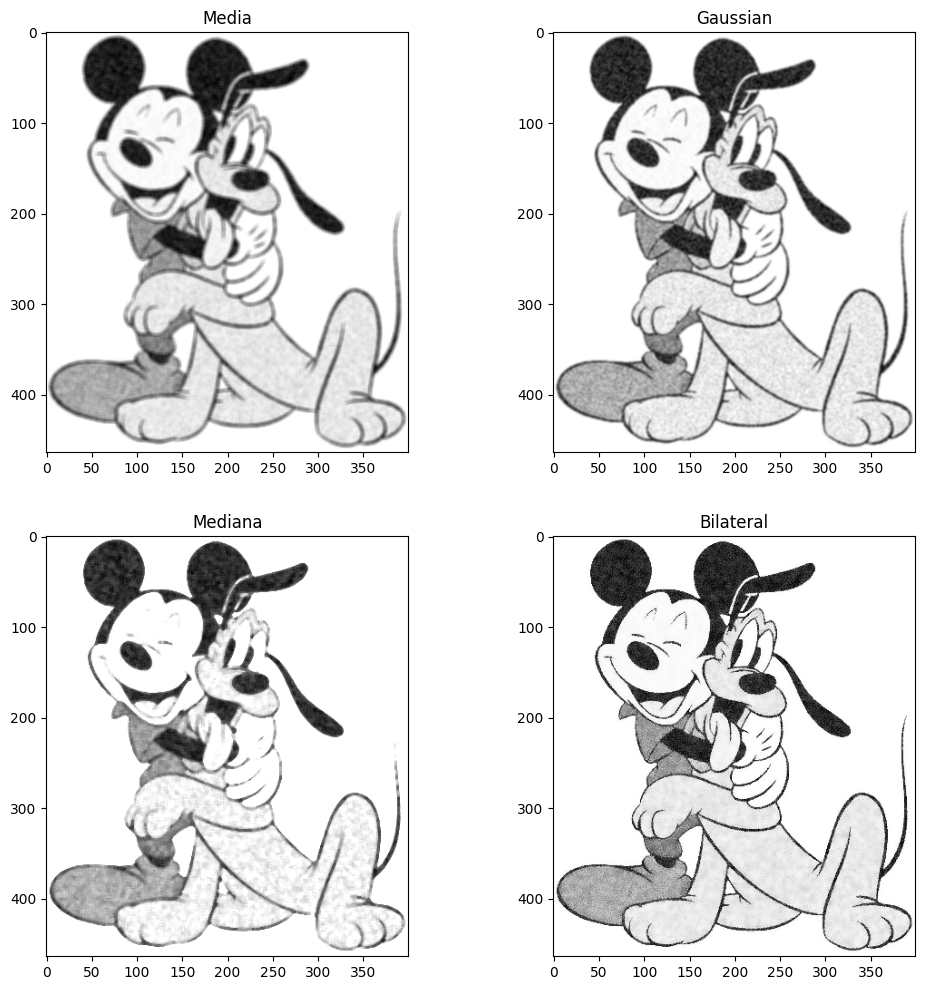

In [14]:
# Ruido uniforme. Como mejora con los filtros de suavizado
rmedia_nu = cv2.blur(img_nu, (5, 5))
rgauss_nu = cv2.GaussianBlur(img_nu, (5, 5), 0)
rmedian_nu = cv2.medianBlur(img_nu, 5)
rbila_nu = cv2.bilateralFilter(img_nu, 9, 50, 75)
plt.figure(figsize=(12, 12))
plt.subplot(221)
plt.imshow(rmedia_nu, "gray"), plt.title("Media")
plt.subplot(222)
plt.imshow(rgauss_nu, "gray"), plt.title("Gaussian")
plt.subplot(223)
plt.imshow(rmedian_nu, "gray"), plt.title("Mediana")
plt.subplot(224)
plt.imshow(rbila_nu, "gray"), plt.title("Bilateral")


(<matplotlib.image.AxesImage at 0x7dad1b5a77c0>, Text(0.5, 1.0, 'Bilateral'))

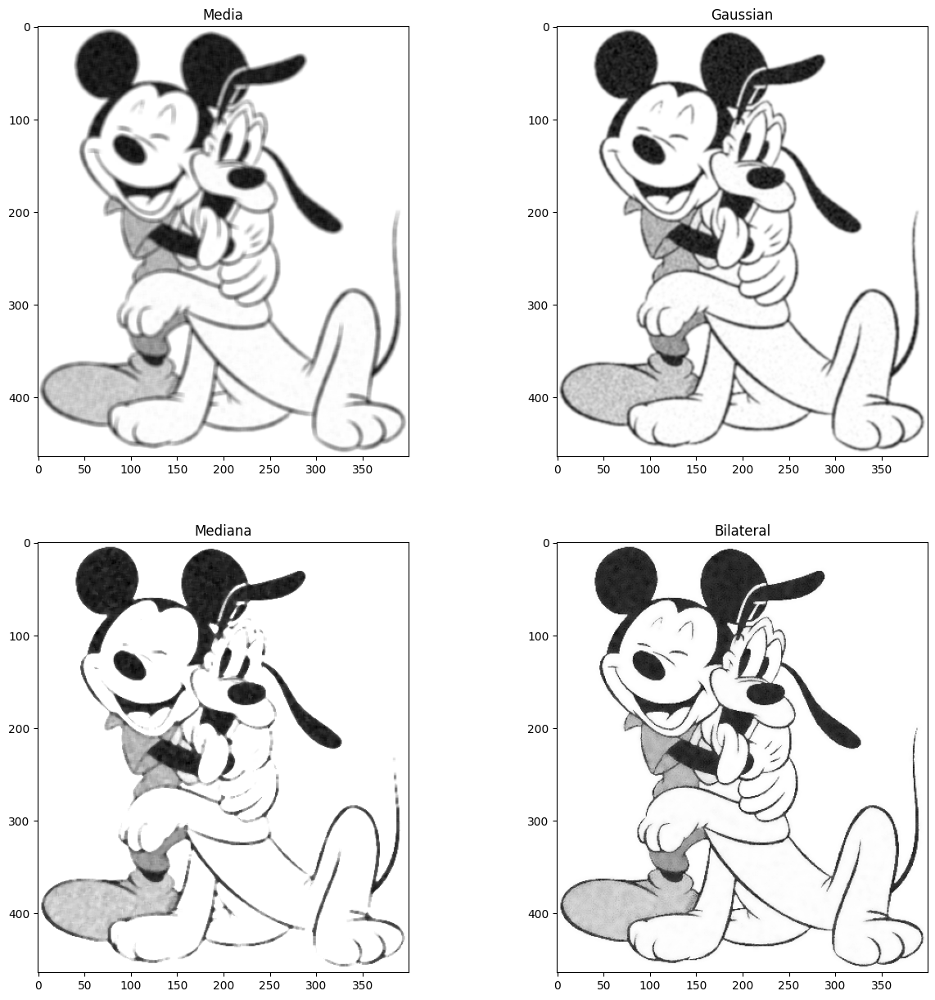

In [15]:
# Ruido gausiano. Como mejora con los filtros de suavizado
rmedia_ng = cv2.blur(img_ng, (5, 5))
rgauss_ng = cv2.GaussianBlur(img_ng, (5, 5), 0)
rmedian_ng = cv2.medianBlur(img_ng, 5)
rbila_ng = cv2.bilateralFilter(img_ng, 9, 50, 75)
plt.figure(figsize=(15, 15))
plt.subplot(221)
plt.imshow(rmedia_ng, "gray"), plt.title("Media")
plt.subplot(222)
plt.imshow(rgauss_ng, "gray"), plt.title("Gaussian")
plt.subplot(223)
plt.imshow(rmedian_ng, "gray"), plt.title("Mediana")
plt.subplot(224)
plt.imshow(rbila_ng, "gray"), plt.title("Bilateral")

(<matplotlib.image.AxesImage at 0x7dad1a18eef0>, Text(0.5, 1.0, 'Bilateral'))

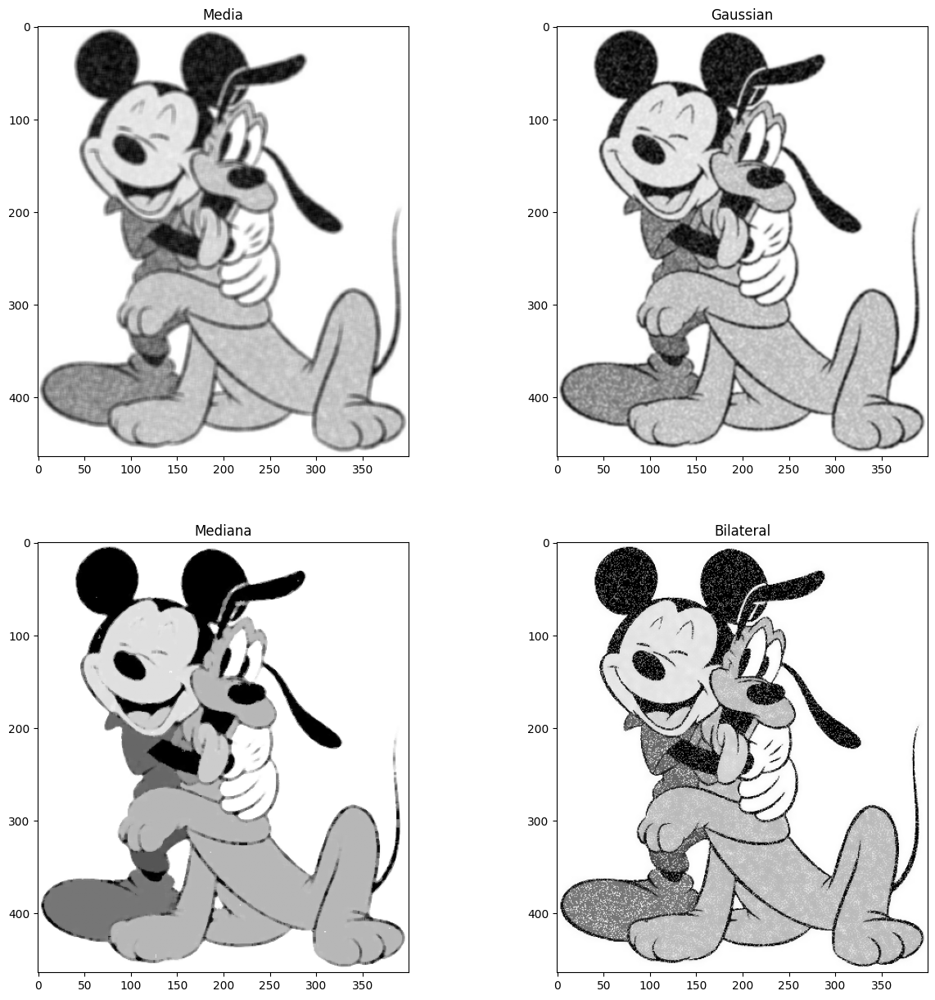

In [16]:
# Ruido impulso Como mejora con los filtros de suavizado
rmedia_ni = cv2.blur(img_ni, (5, 5))
rgauss_ni = cv2.GaussianBlur(img_ni, (5, 5), 0)
rmedian_ni = cv2.medianBlur(img_ni, 5)
rbila_ni = cv2.bilateralFilter(img_ni, 9, 50, 75)
plt.figure(figsize=(15, 15))
plt.subplot(221)
plt.imshow(rmedia_ni, "gray"), plt.title("Media")
plt.subplot(222)
plt.imshow(rgauss_ni, "gray"), plt.title("Gaussian")
plt.subplot(223)
plt.imshow(rmedian_ni, "gray"), plt.title("Mediana")
plt.subplot(224)
plt.imshow(rbila_ni, "gray"), plt.title("Bilateral")

(<matplotlib.image.AxesImage at 0x7dad197f84c0>, Text(0.5, 1.0, 'Bilateral'))

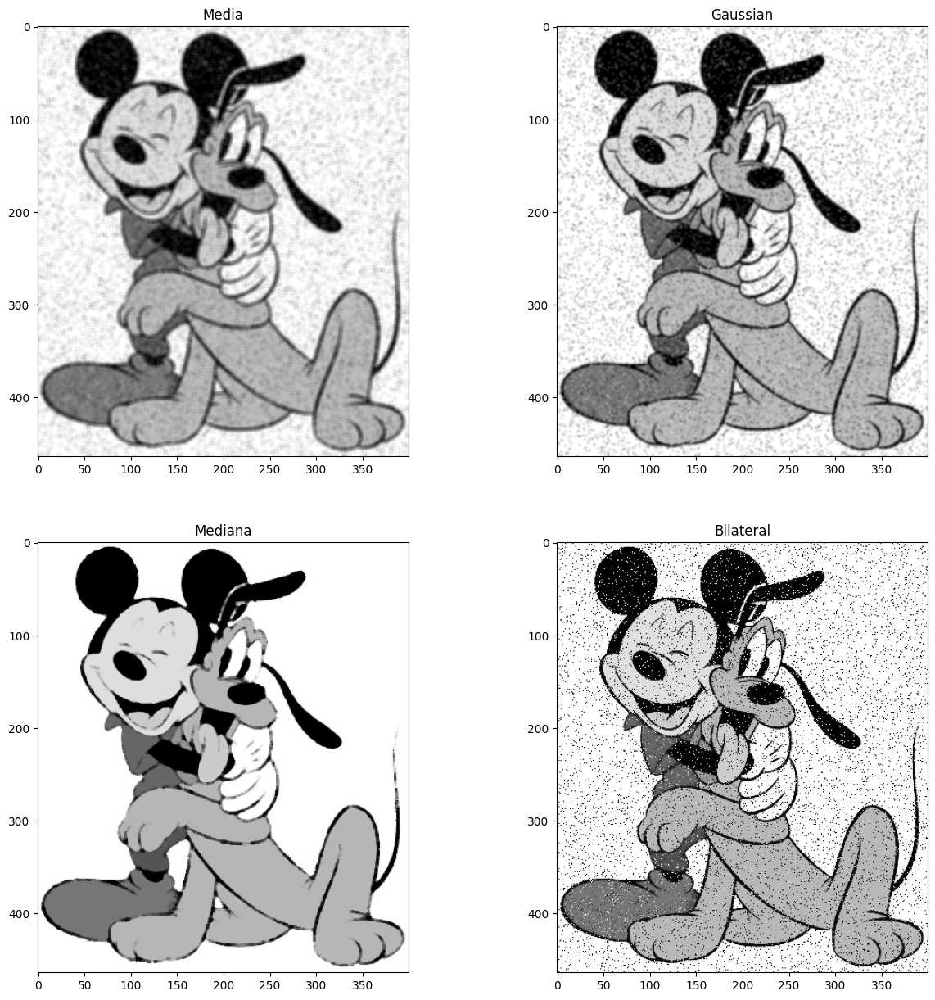

In [17]:
# Ruido sal y pimienta Como mejora con los filtros de suavizado
rmedia_sp = cv2.blur(img_sp, (5, 5))
rgauss_sp = cv2.GaussianBlur(img_sp, (5, 5), 0)
rmedian_sp = cv2.medianBlur(img_sp, 5)
rbila_sp = cv2.bilateralFilter(img_sp, 9, 50, 75)
plt.figure(figsize=(15, 15))
plt.subplot(221)
plt.imshow(rmedia_sp, "gray"), plt.title("Media")
plt.subplot(222)
plt.imshow(rgauss_sp, "gray"), plt.title("Gaussian")
plt.subplot(223)
plt.imshow(rmedian_sp, "gray"), plt.title("Mediana")
plt.subplot(224)
plt.imshow(rbila_sp, "gray"), plt.title("Bilateral")

### Desenfoque de Movimiento 
El desenfoque por movimiento ocurre en diferentes situaciones. Una de ellas es cuando tomamos un foto mientras que nos estamos moviendo en un dirección. Por ejemplo cuando hacemos una foto desde un coche en movimiento. 
El siguiente código permite simular este efecto de desenforque.


(<Axes: title={'center': 'Desenfocada'}>,
 Text(0.5, 1.0, 'Desenfocada'))

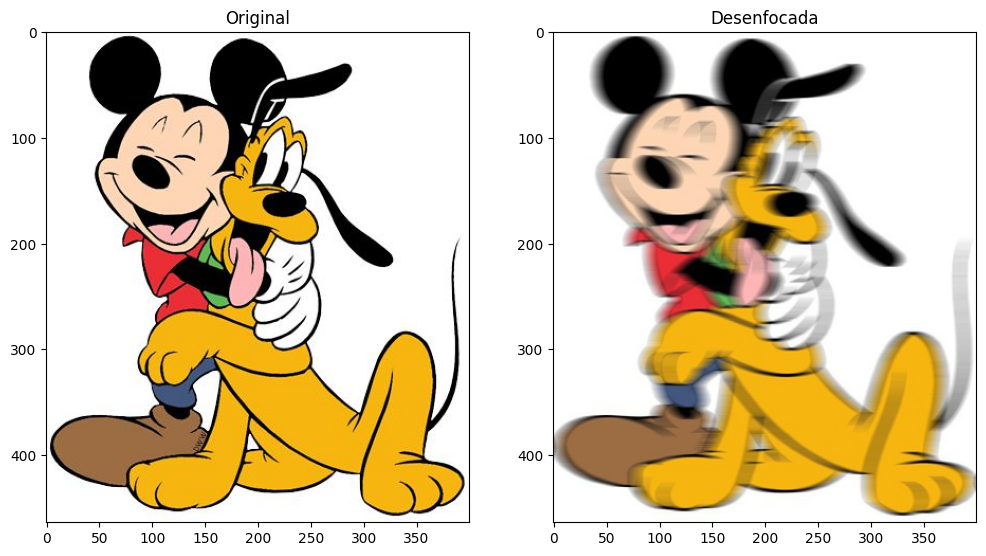

In [18]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread("miki_pluto.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# creamos el filtro de desenfoque
dim = 15
vertical = np.zeros((dim, dim), dtype="uint8")
vertical[int(dim / 2), :] = np.ones((dim), dtype="uint8")
vertical = vertical / dim
output = cv2.filter2D(img, -1, vertical)
plt.figure(figsize=(12, 12))
plt.subplot(1, 2, 1), plt.imshow(img), plt.title("Original")
plt.subplot(1, 2, 2), plt.imshow(output), plt.title("Desenfocada")


### Detección de Aristas o Bordes
La detección de aristas es una de las operaciones fundamentales cuando realizamos procesamiento de imágenes. Este proceso ayuda a reducir la cantidad de datos (pixeles) para realizar el procesamiento y mantener la estructura de la imagen. Distinguimos diferentes formas de obtener las aristas:
* Basados en la primera derivada
* Basados en la segunda derivada.


(Text(0.5, 1.0, 'Prewitt X+Prewitt Y'), ([], []), ([], []))

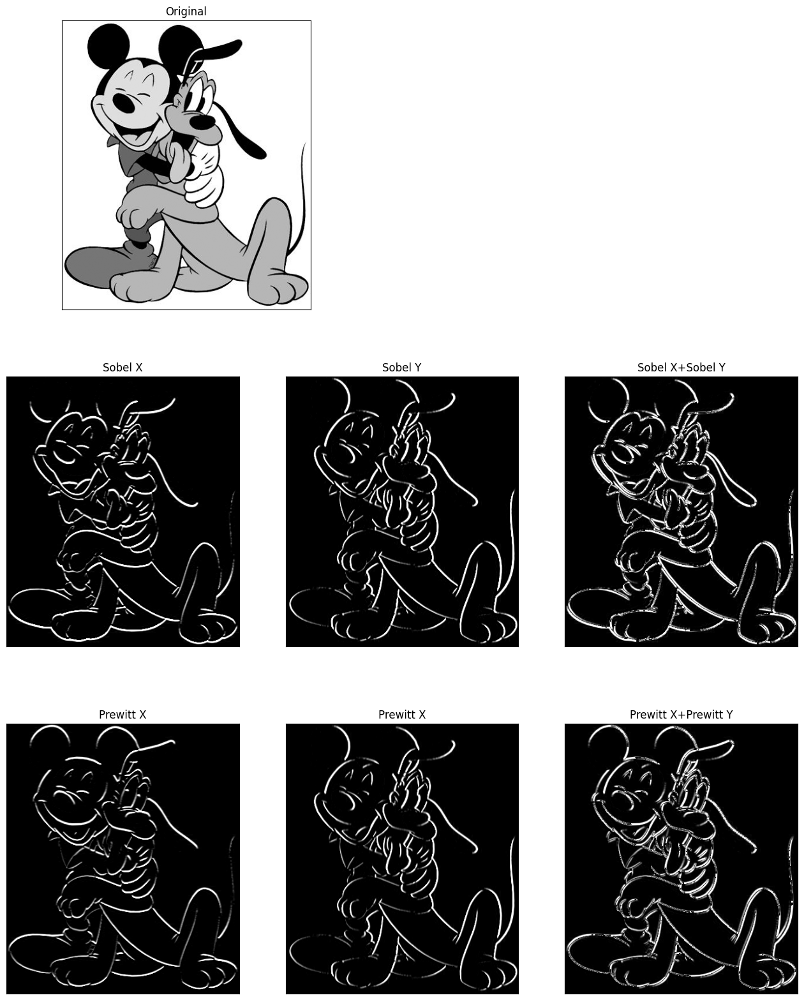

In [19]:
# Basados en le primera derivada
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread("miki_pluto.jpg", 0)
img_g = cv2.GaussianBlur(img, (3, 3), 0)

sobely = cv2.Sobel(img_g, cv2.CV_8U, 1, 0, ksize=3)  # y
sobelx = cv2.Sobel(img_g, cv2.CV_8U, 0, 1, ksize=3)  # x
sobel = sobelx + sobely

# prewitt
kernelx = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
kernely = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewittx = cv2.filter2D(img_g, -1, kernelx)
prewitty = cv2.filter2D(img_g, -1, kernely)
prewitt = prewittx + prewitty

plt.figure(figsize=(16, 20))
plt.subplot(3, 2, 1), plt.imshow(img, "gray")
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.subplot(3, 3, 4), plt.imshow(sobelx, "gray")
plt.title("Sobel X"), plt.xticks([]), plt.yticks([])
plt.subplot(3, 3, 5), plt.imshow(sobely, "gray")
plt.title("Sobel Y"), plt.xticks([]), plt.yticks([])
plt.subplot(3, 3, 6), plt.imshow(sobel, "gray")
plt.title("Sobel X+Sobel Y"), plt.xticks([]), plt.yticks([])

plt.subplot(3, 3, 7), plt.imshow(prewittx, "gray")
plt.title("Prewitt X"), plt.xticks([]), plt.yticks([])
plt.subplot(3, 3, 8), plt.imshow(prewitty, "gray")
plt.title("Prewitt X"), plt.xticks([]), plt.yticks([])
plt.subplot(3, 3, 9), plt.imshow(prewitt, "gray")
plt.title("Prewitt X+Prewitt Y"), plt.xticks([]), plt.yticks([])

(<matplotlib.image.AxesImage at 0x7dad1b52f490>, Text(0.5, 1.0, 'Laplaciana'))

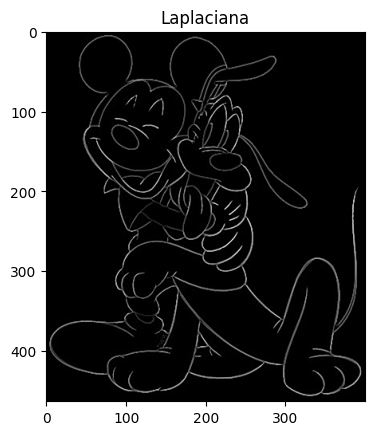

In [20]:
# Segunda derivada
laplacian = cv2.Laplacian(img_g, cv2.CV_8U)
plt.imshow(laplacian, "gray"), plt.title("Laplaciana")

**CANNY** El detector de aristas Canny es primera derivada. Existen diferentes implementaciones en cuanto al filtro usado. En la propuesta original de Canny penso en el  filtro primera derivada de una gausiana con el que ya esta evitando el ruido en la imagen. Pero en la práctica también se usa filtros más rápidos como Sobel.  Además tiene una fase de supresión no-máxima (para adelgazar las fronteras) e histeresis (un proceso de umbralización). Los parámetros del filtro son:
* La imagen de entrada
* minVal and maxVal: son los valores para establecer el proceso de umbralización basado en histérisis.
* size el tamaño del filtro de Sobel .

(<matplotlib.image.AxesImage at 0x7dad40096590>, Text(0.5, 1.0, 'Canny'))

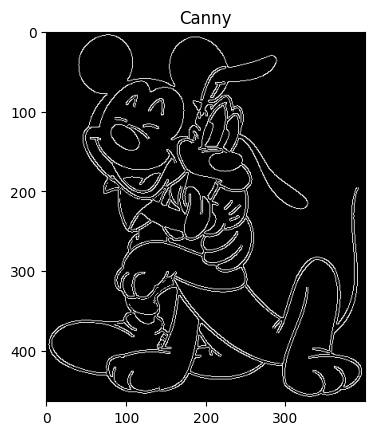

In [21]:
img_canny = cv2.Canny(img_g, 50, 100, 3)
plt.imshow(img_canny, "gray"), plt.title("Canny")

### Otros filtros
En primer lugar vamos a ver un filtro que permite aumentar la fuerza de las fronteras y mejorar los perfiles. Este se construye como el negativo de la Laplacina por un parámetro alpha.

(<matplotlib.image.AxesImage at 0x7dad400d1420>,
 Text(0.5, 1.0, 'Perfilada+Canny'))

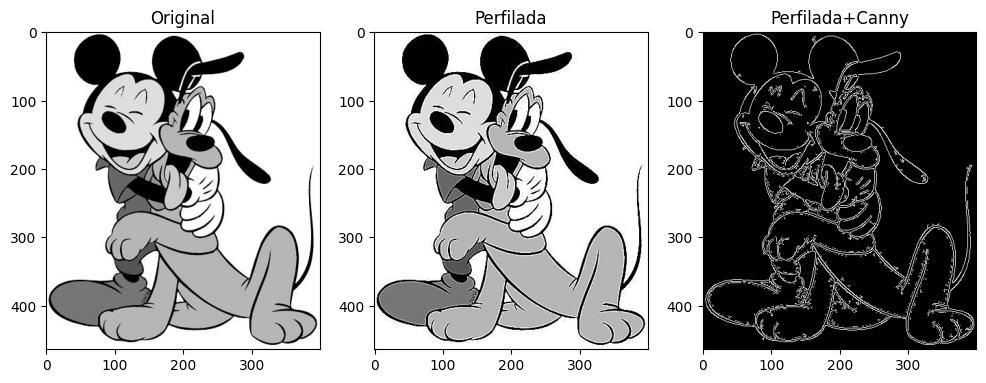

In [22]:
alfa = 0.3
h = np.array(
    [[-alfa, -alfa, -alfa], [-alfa, (8 * alfa + 1), -alfa], [-alfa, -alfa, -alfa]]
)
img_sharp = cv2.filter2D(img, -1, h)
i_canny = cv2.Canny(img_sharp, 50, 210)
plt.figure(figsize=(12, 12))
plt.subplot(1, 3, 1)
plt.imshow(img, "gray"), plt.title("Original")
plt.subplot(1, 3, 2)
plt.imshow(img_sharp, "gray"), plt.title("Perfilada")
plt.subplot(1, 3, 3)
plt.imshow(i_canny, "gray"), plt.title("Perfilada+Canny")

Otra forma de  perfilar es a la imagen restarle el resultado de convolucionar con una Laplaciana

(<matplotlib.image.AxesImage at 0x7dad179dddb0>,
 Text(0.5, 1.0, 'Perfilada+Canny'))

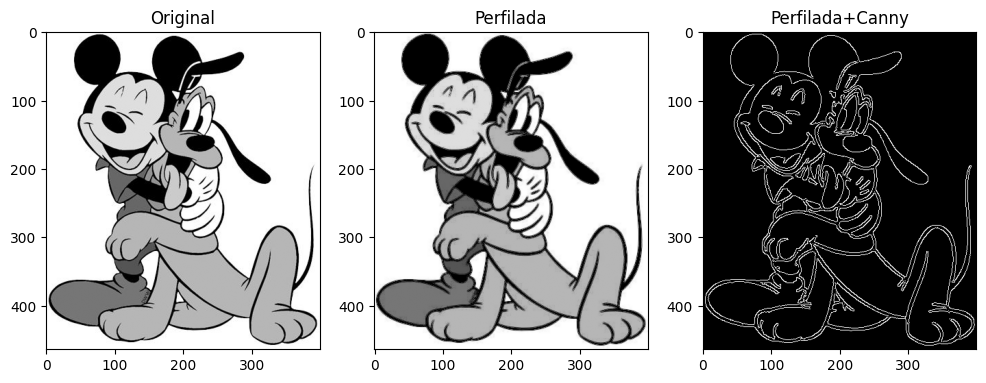

In [23]:
alfa = 0.3
h = np.array([[-alfa, -alfa, -alfa], [-alfa, 8 * alfa, -alfa], [-alfa, -alfa, -alfa]])
img_lap = cv2.filter2D(img, -1, h)
out = cv2.addWeighted(img, 1, img_lap, -1, 0)
i_canny = cv2.Canny(out, 50, 220)
plt.figure(figsize=(12, 12))
plt.subplot(1, 3, 1)
plt.imshow(img, "gray"), plt.title("Original")
plt.subplot(1, 3, 2)
plt.imshow(out, "gray"), plt.title("Perfilada")
plt.subplot(1, 3, 3)
plt.imshow(i_canny, "gray"), plt.title("Perfilada+Canny")

Es importante tener en cuenta que este tipo de filtros aplicado a imágenes con desenfoque por movimiento aumentará el desenfoque. 

### Detección de puntos esquina
Los puntos esquina en una imagen son regiones que tienen un fuerte diferencial en intensidad en todas las direcciones. Uno de los algoritmos que opencv tiene implementado es el detector de esquinas de Harris. 
OpenCV tiene implementada la función cv2.cornerHarris(), en la que los argumentos que necesita son:
* img - imagen de entrada, debe ser de niveles de gris y de tipo float32 
* blockSize - es el tamaño del entorno a considerar la detección de esquinas. 
* ksize - tamaño del filtro sobel que se aplica para ver los cambios de intensidades. 
* k - factor que  se integra en la formulación del detector de Harris.  Conforme sea más grande habrá menos puntos esquina.  



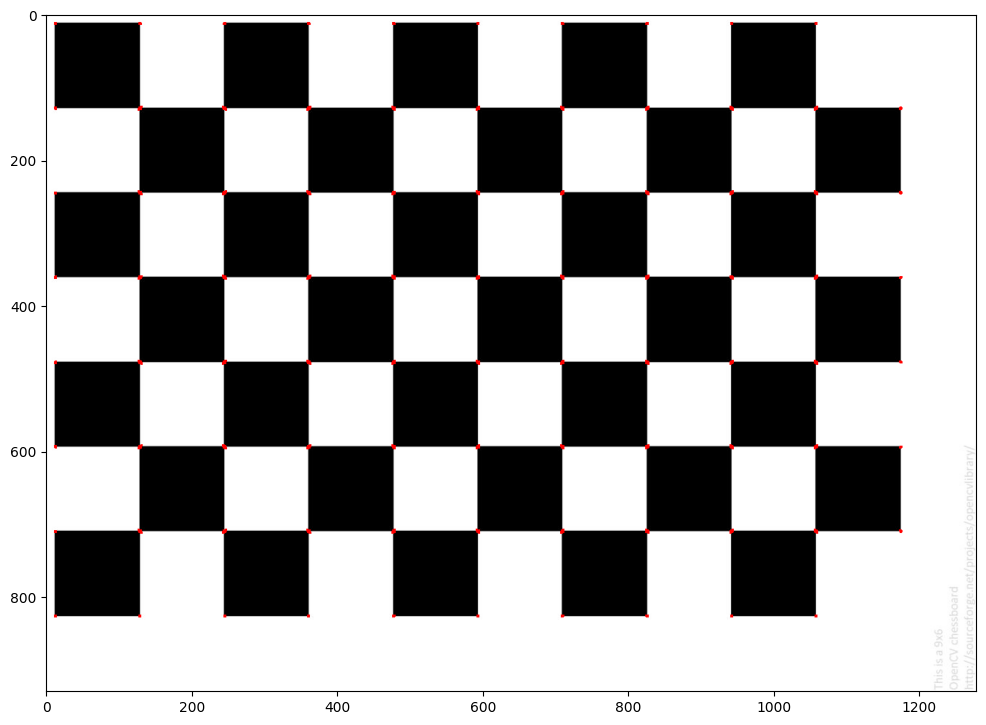

In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

filename = "chessboard.jpg"
img = cv2.imread(filename)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)


# resultado se dilata para marcar mejor las esquinas
dst = cv2.dilate(dst, None)

# Umbralización es un factor que depende del tipo de imagen
img[dst > 0.01 * dst.max()] = [255, 0, 0]
plt.figure(figsize=(12, 12))
plt.imshow(img)


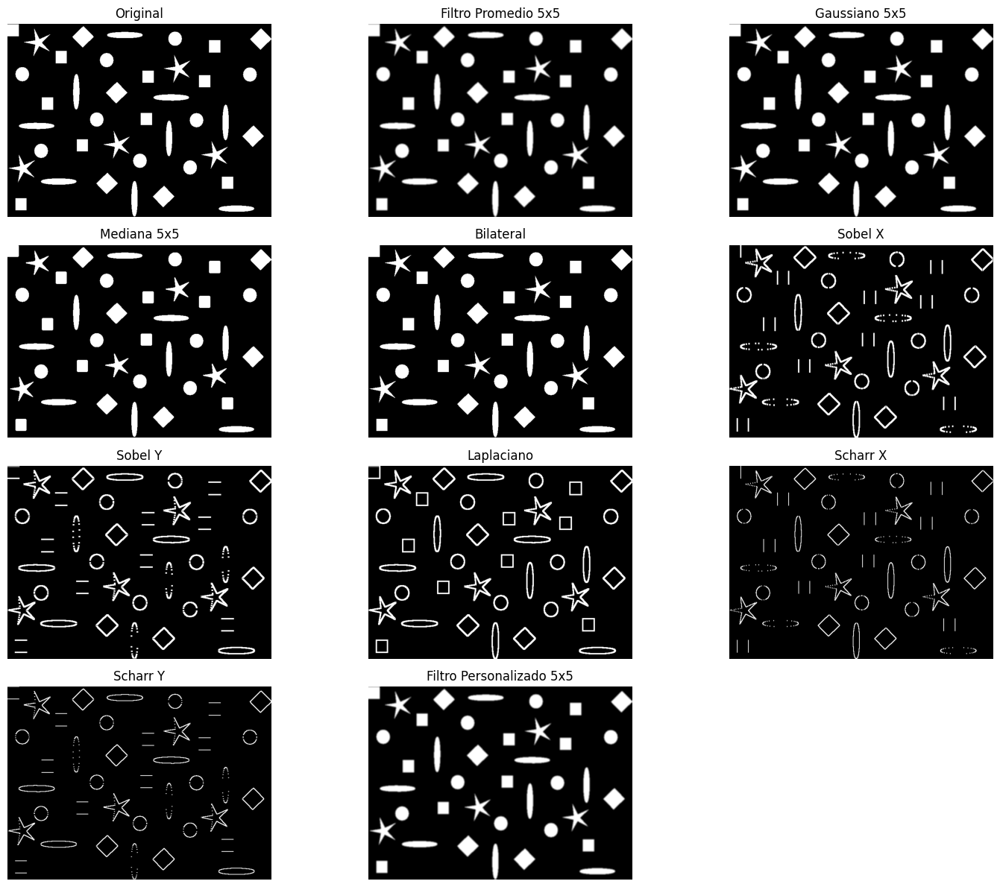

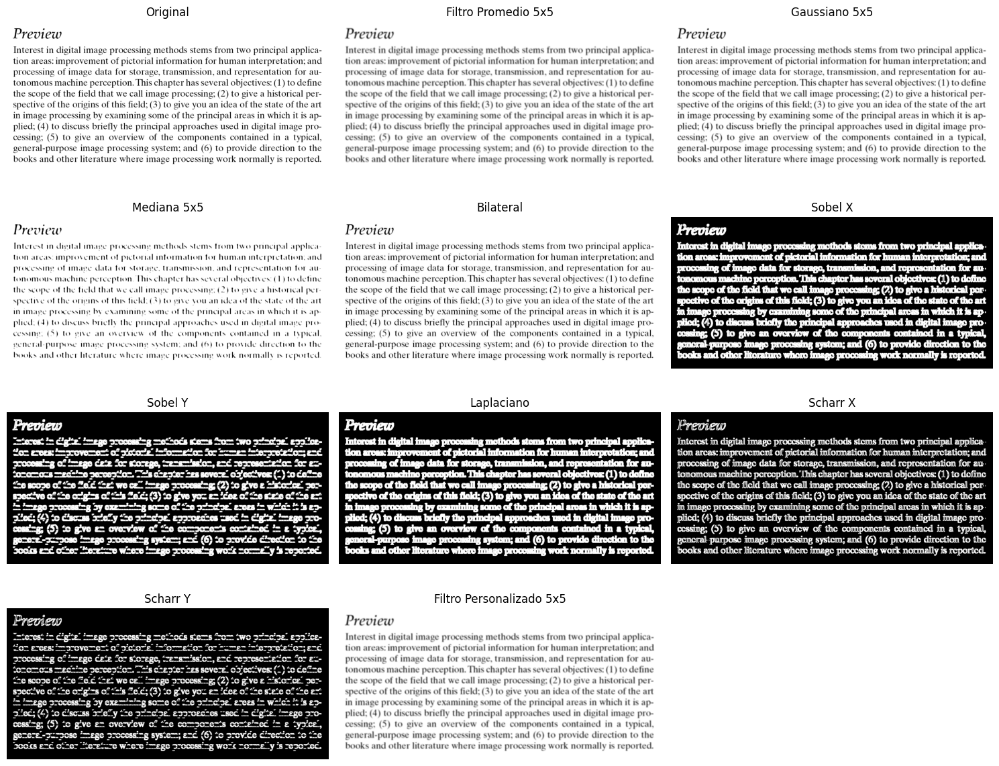

In [25]:
# Ejercicio 1
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Cargar imagen en escala de grises
I = cv2.imread("formas.png", 0)

# Crear una lista de filtros con sus configuraciones
filtros = [
    ("Original", I),
    ("Filtro Promedio 5x5", cv2.blur(I, (5, 5))),
    ("Gaussiano 5x5", cv2.GaussianBlur(I, (5, 5), 0)),
    ("Mediana 5x5", cv2.medianBlur(I, 5)),
    ("Bilateral", cv2.bilateralFilter(I, 9, 75, 75)),
    ("Sobel X", cv2.convertScaleAbs(cv2.Sobel(I, cv2.CV_64F, 1, 0, ksize=5))),
    ("Sobel Y", cv2.convertScaleAbs(cv2.Sobel(I, cv2.CV_64F, 0, 1, ksize=5))),
    ("Laplaciano", cv2.convertScaleAbs(cv2.Laplacian(I, cv2.CV_64F, ksize=5))),
    ("Scharr X", cv2.convertScaleAbs(cv2.Scharr(I, cv2.CV_64F, 1, 0))),
    ("Scharr Y", cv2.convertScaleAbs(cv2.Scharr(I, cv2.CV_64F, 0, 1))),
    ("Filtro Personalizado 5x5", cv2.filter2D(I, -1, np.ones((5, 5), np.float32) / 25)),
]

# Configurar la visualización
plt.figure(figsize=(15, 12))
for i, (nombre, imagen) in enumerate(filtros):
    plt.subplot(4, 3, i + 1)
    plt.imshow(imagen, cmap="gray")
    plt.title(nombre)
    plt.axis("off")

plt.tight_layout()
plt.show()

I = cv2.imread("texto.png", 0)

# Crear una lista de filtros con sus configuraciones
filtros = [
    ("Original", I),
    ("Filtro Promedio 5x5", cv2.blur(I, (5, 5))),
    ("Gaussiano 5x5", cv2.GaussianBlur(I, (5, 5), 0)),
    ("Mediana 5x5", cv2.medianBlur(I, 5)),
    ("Bilateral", cv2.bilateralFilter(I, 9, 75, 75)),
    ("Sobel X", cv2.convertScaleAbs(cv2.Sobel(I, cv2.CV_64F, 1, 0, ksize=5))),
    ("Sobel Y", cv2.convertScaleAbs(cv2.Sobel(I, cv2.CV_64F, 0, 1, ksize=5))),
    ("Laplaciano", cv2.convertScaleAbs(cv2.Laplacian(I, cv2.CV_64F, ksize=5))),
    ("Scharr X", cv2.convertScaleAbs(cv2.Scharr(I, cv2.CV_64F, 1, 0))),
    ("Scharr Y", cv2.convertScaleAbs(cv2.Scharr(I, cv2.CV_64F, 0, 1))),
    ("Filtro Personalizado 5x5", cv2.filter2D(I, -1, np.ones((5, 5), np.float32) / 25)),
]

# Configurar la visualización
plt.figure(figsize=(15, 12))
for i, (nombre, imagen) in enumerate(filtros):
    plt.subplot(4, 3, i + 1)
    plt.imshow(imagen, cmap="gray")
    plt.title(nombre)
    plt.axis("off")

plt.tight_layout()
plt.show()

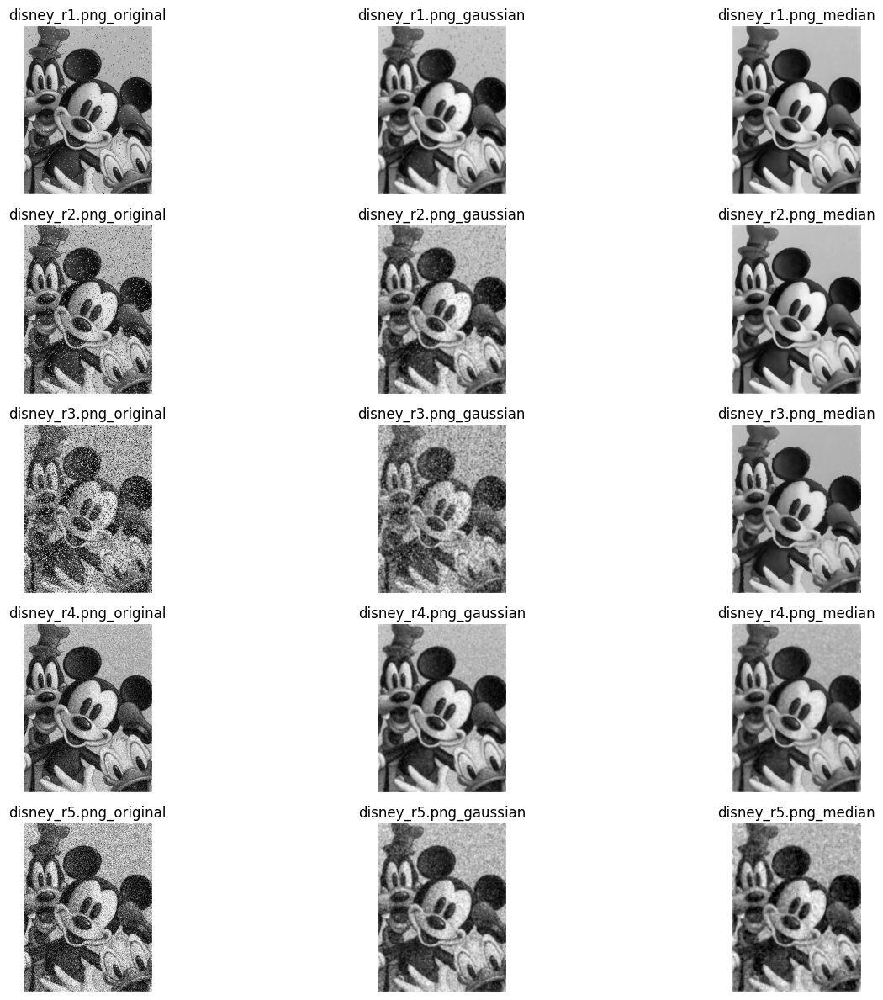

In [26]:
# Ejercicio 2
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Cargar las imágenes en escala de grises
plt.figure(figsize=(15, 12))
for i in range(1, 6):
    name = f"disney_r{i}.png"
    I = cv2.imread(name, 0)
    gaussian = cv2.GaussianBlur(I, (5, 5), 0)
    median = cv2.medianBlur(I, 5)

    # Mostrar la imagen original
    plt.subplot(5, 3, 3 * i - 2)
    plt.imshow(I, cmap="gray")
    plt.title(name + "_original")
    plt.axis("off")

    # Mostrar la imagen filtrada con gaussiano
    plt.subplot(5, 3, 3 * i - 1)
    plt.imshow(gaussian, cmap="gray")
    plt.title(name + "_gaussian")
    plt.axis("off")

    # Mostrar la imagen filtrada con mediana
    plt.subplot(5, 3, 3 * i)
    plt.imshow(median, cmap="gray")
    plt.title(name + "_median")
    plt.axis("off")

plt.tight_layout()
plt.show()

- En la primera imagen, el filtro de mediana hace un muy buen trabajo eliminando el ruido en la imagen, mientras que el gaussiano distorsiona y suaviza, quedando menos nítido.
- Lo mismo ocurre en r2 y en r3. En r4 y r5 el filtro gaussiano parece funcionar mejor o al menos parecido al de la mediana.
- El filtro de mediana es más efectivo para ruidos de tipo "sal y pimienta", ya que al ser el ruido puntos blancos y negros, estos quedan en los extremos del valor del píxel y la mediana es justo el valor central, por lo que elimina valores extremos al realizar la convolución. El gaussiano en cambio realiza una ponderación.

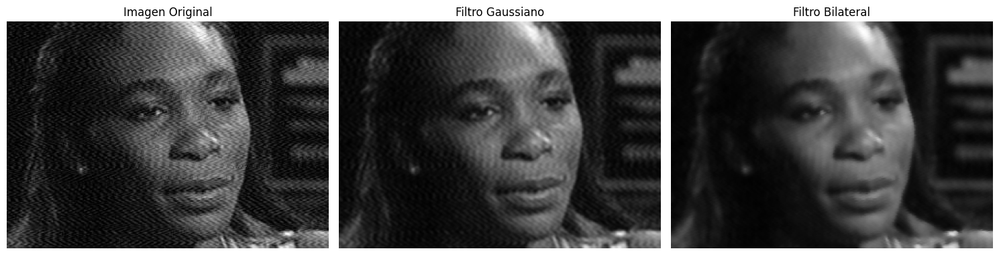

In [27]:
# Ejercicio 5

import numpy as np
import cv2
from matplotlib import pyplot as plt

# Cargar la imagen en escala de grises
name = "distorsion1.jpg"
I = cv2.imread(name, cv2.IMREAD_GRAYSCALE)


# Aplicar el filtro Gaussiano
gaussian_blur = cv2.GaussianBlur(I, (5, 5), 0)  # Kernel 5x5
# Aplicar el filtro Bilateral
bilateral_blur = cv2.bilateralFilter(I, 9, 75, 75)  # d=9, sigmaColor=75, sigmaSpace=75
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(I, cmap="gray")
plt.title("Imagen Original")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(gaussian_blur, cmap="gray")
plt.title("Filtro Gaussiano")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(bilateral_blur, cmap="gray")
plt.title("Filtro Bilateral")
plt.axis("off")
plt.tight_layout()
plt.show()


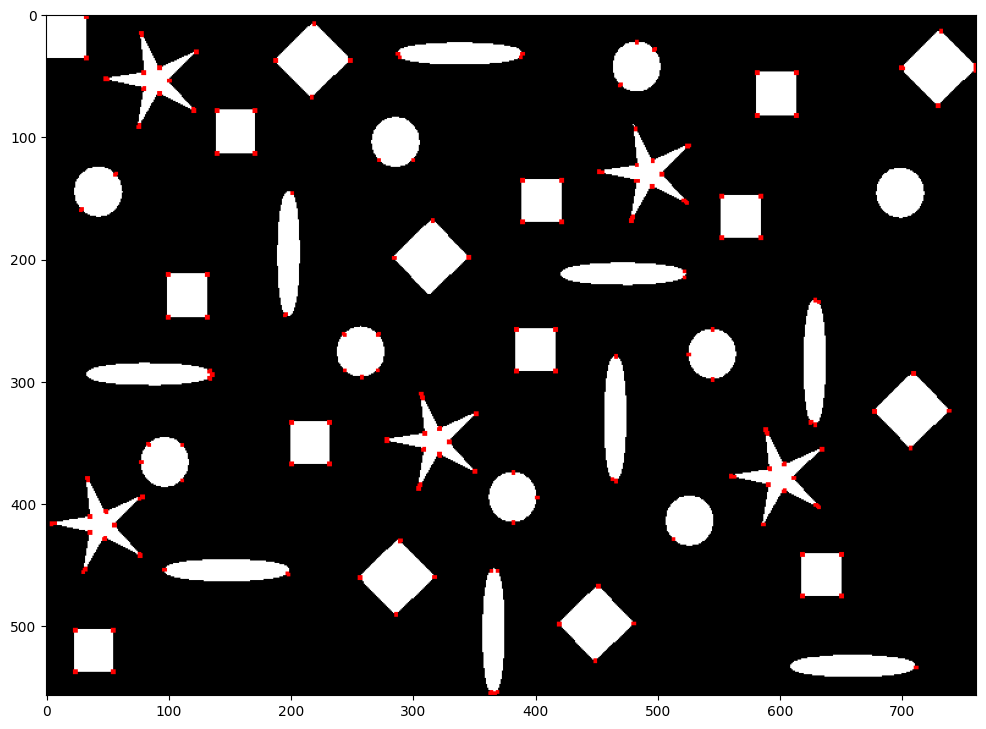

In [28]:
# Ejercicio 5

import cv2
import numpy as np
from matplotlib import pyplot as plt

filename = "formas.png"
img = cv2.imread(filename)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)


# resultado se dilata para marcar mejor las esquinas
dst = cv2.dilate(dst, None)

# Umbralización es un factor que depende del tipo de imagen
img[dst > 0.1 * dst.max()] = [255, 0, 0]
plt.figure(figsize=(12, 12))
plt.imshow(img)


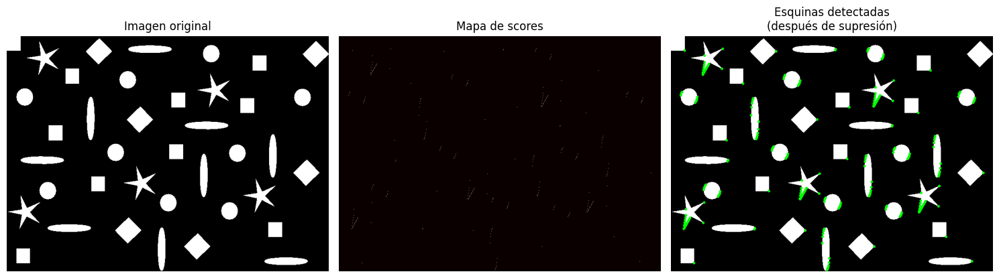

In [65]:
# Ejercicio 6
import cv2
import numpy as np
from matplotlib import pyplot as plt

def moravec(img: np.ndarray):
    threshold = 1000
    # Creamos una matriz de scores del mismo tamaño que la imagen
    corner_scores = np.zeros_like(img, dtype=float)
    xy_shifts = [(1, 0), (1, 1), (0, 1), (-1, 1)]
    
    # Primero calculamos todos los scores
    for y in range(1, img.shape[0]-1):
        for x in range(1, img.shape[1]-1):
            E = float('inf')
            
            for shift in xy_shifts:
                y_shift = y + shift[0]
                x_shift = x + shift[1]
                
                diff = int(img[y_shift, x_shift]) - int(img[y, x])
                E_temp = diff * diff
                
                if E_temp < E:
                    E = E_temp
            
            if E > threshold:
                corner_scores[y, x] = E

    # Aplicamos supresión de no máximos
    window_size = 3
    corners = []
    pad = window_size // 2
    
    for y in range(pad, img.shape[0]-pad):
        for x in range(pad, img.shape[1]-pad):
            if corner_scores[y, x] > 0:
                window = corner_scores[y-pad:y+pad+1, x-pad:x+pad+1]
                if corner_scores[y, x] != np.max(window):
                    corner_scores[y, x] = 0
                else:
                    corners.append((x, y))
    
    return corners, corner_scores

filename = "formas.png"
img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

if img is None:
    raise ValueError(f"Could not read image file: {filename}")

corners, corner_scores = moravec(img)
img_display = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

for corner in corners:
    cv2.circle(img_display, (corner[0], corner[1]), 3, (0, 255, 0), -1)

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(img, cmap='gray')
plt.title("Imagen original")
plt.axis("off")

plt.subplot(132)
plt.imshow(corner_scores, cmap='hot')
plt.title("Mapa de scores")
plt.axis("off")

plt.subplot(133)
plt.imshow(cv2.cvtColor(img_display, cv2.COLOR_BGR2RGB))
plt.title("Esquinas detectadas\n(después de supresión)")
plt.axis("off")

plt.tight_layout()
plt.show()

- El filtro gaussiano ayuda con la disminución de ruido, pero en este caso el de filtrado bilateral parece ser el que mejor filtra la imagen. Esto se debe a que la imagen original parece tener un tipo de ruido "lateral", es decir, un tipo de ruido que modifica los píxeles de lado a lado, como si fuese un desenfoque.

### Ejercicios
<ol>
    <li> Utiliza el filtrado para buscar formas en una imagen. Para este ejercicio puedes usar las siguientes imágenes:
<ol>
    <li>formas.png, estrella.png, ovalo.png, cuadrado.png, cuadrado2.png,cuadrado3.png
   <li>texto.png, letra_i.png, letra_k.png, letra_m.png, letra_o.png, letra_p.png
   </ol>
    <li>Compara el resultado que producen el filtrado gaussiano y el filtro de mediana sobre las imágenes disney_r1.png ... disney_r5.png.    
    <li>Analizar la imagen distorsion1.jpg y aplicar diferentes técnicas para mejorarla
(eliminación del ruido). En concreto, prueba con suavizados gaussianos y con un suavizado bilateral.
    <li>Obtener sobre la imagen formas.png las esquinas usando el método de Harris. Implementar el algoritmo de Moravec y aplicalo para obtener las esquinas de formas.png.    
        
        
</ol>        